<a href="https://colab.research.google.com/github/JUMITO737/Regresion_No_Lineal/blob/main/Act_6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Actividad 6 (Regresión No Lineal)

## Juan Carlos Ramirez Espinosa A01706986

1. Crear un nuevo repositorio nuevo con el nombre: Regresión No Lineal

2. Agregar el archivo: “Cuentas_credicel.csv”

3. Realiza las acciones de preprocesamiento necesarias: Nulos y Outliers

4. Elegir 5 modelos de correlación No lineal y Analizar la correlación que existe entre las siguientes variables: Riesgo (variable objetivo), score_buro (variable objetivo), porc_eng (variable objetivo), y limite_crédito (variable objetivo), aplicando la herramienta de “Regresión No Lineal”

6. Realizar una tabla de todos los coeficientes de determinación obtenidos para cada correlación analizada, según sea el caso.

7. Crear los archivos requeridos en Google Colab y respaldarlos en GitHub.

8. Generar un reporte comparativo sobre los análisis realizados y subirlo a GitHub, en formato pdf.
Subir el link del repositorio en CANVAS para “Evaluación”

## Librerias :

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.special as special
from scipy.optimize import curve_fit
import seaborn as sns
from sklearn.metrics import r2_score

## Archivos :

In [ ]:
df = pd.read_csv('cuentas_credicel.csv', encoding='latin-1')
df.head(5)

<ipython-input-2-c71743e22efc>:1: DtypeWarning: Columns (30) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('cuentas_credicel.csv', encoding='latin-1')


,ï»¿folio,tag,folio_solicitud,fecha,marca,modelo,plazo,precio,enganche,descuento,...,porc_eng,limite_credito,semana_actual,cp_cliente,edad_cliente,cd_cliente,edo_cliente,cd_venta,edo_venta,curp
0,3,HDNAWQ3A,30,12/11/2021 19:00,ZTE,Blade A3 2020 RO B,26S,1949.0,780.0,0.0,...,40.02,5000,26,NaN,23.0,0,0,Tantoyuca,Veracruz,AEVM980413MVZNDR02
1,4,M418YNR4,33,12/11/2021 19:15,MOTOROLA,LTE XT2097-12 E7I POWER Azul,13S,2999.0,1050.0,0.0,...,35.01,6000,13,NaN,60.0,PUEBLA,PUE.,Heroica Puebla de Zaragoza,Puebla,ZALC610119MPLPRR07
2,5,SZ7V3NZT,37,13/11/2021 14:13,ZTE,BLADE A3 2020 Gris,13S,1959.0,490.0,0.0,...,25.01,0,74,NaN,58.0,TANTOYUCA,VER.,0,0,0
3,6,9I08UIQZ,38,13/11/2021 15:45,ZTE,BLADE A3 2020 Gris,13S,1959.0,490.0,0.0,...,25.01,7000,13,NaN,42.0,AMXTLAN PUE,NaN,Zacatlan,Puebla,SAMJ790115MPLNRS02
4,7,JMF4LKYU,44,13/11/2021 16:10,MOTOROLA,G10 B,39S,4299.0,1075.0,0.0,...,25.01,7000,74,NaN,33.0,TANTOYUCA,VER.,Tantoyuca,Veracruz,TEHF880707HVZRRR07


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22735 entries, 0 to 22734
Data columns (total 39 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ï»¿folio            22735 non-null  int64  
 1   tag                 22735 non-null  object 
 2   folio_solicitud     22735 non-null  int64  
 3   fecha               22735 non-null  object 
 4   marca               22735 non-null  object 
 5   modelo              22735 non-null  object 
 6   plazo               22735 non-null  object 
 7   precio              22735 non-null  float64
 8   enganche            22735 non-null  float64
 9   descuento           22735 non-null  float64
 10  semana              22735 non-null  int64  
 11  monto_financiado    22735 non-null  float64
 12  costo_total         22735 non-null  int64  
 13  monto_accesorios    22735 non-null  float64
 14  agente_venta        22735 non-null  object 
 15  dis_venta           22735 non-null  object 
 16  stat

## Limpieza :

### Valores Nulos :

In [ ]:
df.isnull().sum()

ï»¿folio                 0
tag                      0
folio_solicitud          0
fecha                    0
marca                    0
modelo                   0
plazo                    0
precio                   0
enganche                 0
descuento                0
semana                   0
monto_financiado         0
costo_total              0
monto_accesorios         0
agente_venta             0
dis_venta                0
status                   0
fraude                   0
empresa                 13
inversion                0
pagos_realizados         0
reautorizacion           0
fecha_ultimo_pago     3356
fecha_pago_proximo    3356
status_cuenta         3314
puntos                   0
riesgo                   0
score_buro               0
razones_buro          7340
porc_eng                 0
limite_credito           0
semana_actual            0
cp_cliente            7243
edad_cliente             9
cd_cliente               0
edo_cliente              8
cd_venta                 0
e

In [ ]:
df1 =df.fillna(method="bfill")
df1.isnull().sum()

ï»¿folio               0
tag                    0
folio_solicitud        0
fecha                  0
marca                  0
modelo                 0
plazo                  0
precio                 0
enganche               0
descuento              0
semana                 0
monto_financiado       0
costo_total            0
monto_accesorios       0
agente_venta           0
dis_venta              0
status                 0
fraude                 0
empresa                0
inversion              0
pagos_realizados       0
reautorizacion         0
fecha_ultimo_pago      0
fecha_pago_proximo     0
status_cuenta         35
puntos                 0
riesgo                 0
score_buro             0
razones_buro           0
porc_eng               0
limite_credito         0
semana_actual          0
cp_cliente             0
edad_cliente           0
cd_cliente             0
edo_cliente            0
cd_venta               0
edo_venta              0
curp                   0
dtype: int64

In [ ]:
df1 = df1.fillna(method="ffill")
df1.isnull().sum()

ï»¿folio              0
tag                   0
folio_solicitud       0
fecha                 0
marca                 0
modelo                0
plazo                 0
precio                0
enganche              0
descuento             0
semana                0
monto_financiado      0
costo_total           0
monto_accesorios      0
agente_venta          0
dis_venta             0
status                0
fraude                0
empresa               0
inversion             0
pagos_realizados      0
reautorizacion        0
fecha_ultimo_pago     0
fecha_pago_proximo    0
status_cuenta         0
puntos                0
riesgo                0
score_buro            0
razones_buro          0
porc_eng              0
limite_credito        0
semana_actual         0
cp_cliente            0
edad_cliente          0
cd_cliente            0
edo_cliente           0
cd_venta              0
edo_venta             0
curp                  0
dtype: int64

In [ ]:
df1.isnull().sum().sum()

0

In [ ]:
df1.shape

(22735, 39)

### Outliners :

In [ ]:
df1['limite_credito'] = pd.to_numeric(df1['limite_credito'], errors='coerce')
df1['limite_credito'].fillna(7000, inplace=True)

In [ ]:
numeric_columns = df1.select_dtypes(include=['number'])
categoric_columns = df1.select_dtypes(include=['object'])

In [ ]:
def remove_outliers_iqr(df1, column_name, threshold=1.5):
    Q1 = df1[column_name].quantile(0.25)
    Q3 = df1[column_name].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - threshold * IQR
    upper_bound = Q3 + threshold * IQR
    df1 = df1[(df1[column_name] >= lower_bound) & (df1[column_name] <= upper_bound)]
    return df1

for column in numeric_columns.columns:
    df1 = remove_outliers_iqr(df1, column)

res = pd.concat([df1, categoric_columns], axis = 1)

res.shape

(22735, 57)

In [ ]:
numeric = res.select_dtypes(include=['number']).columns
df2 = res.dropna(subset=numeric)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22735 entries, 0 to 22734
Data columns (total 39 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ï»¿folio            22735 non-null  int64  
 1   tag                 22735 non-null  object 
 2   folio_solicitud     22735 non-null  int64  
 3   fecha               22735 non-null  object 
 4   marca               22735 non-null  object 
 5   modelo              22735 non-null  object 
 6   plazo               22735 non-null  object 
 7   precio              22735 non-null  float64
 8   enganche            22735 non-null  float64
 9   descuento           22735 non-null  float64
 10  semana              22735 non-null  int64  
 11  monto_financiado    22735 non-null  float64
 12  costo_total         22735 non-null  int64  
 13  monto_accesorios    22735 non-null  float64
 14  agente_venta        22735 non-null  object 
 15  dis_venta           22735 non-null  object 
 16  stat

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6294 entries, 7243 to 22732
Data columns (total 57 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ï»¿folio            6294 non-null   float64
 1   tag                 6294 non-null   object 
 2   folio_solicitud     6294 non-null   float64
 3   fecha               6294 non-null   object 
 4   marca               6294 non-null   object 
 5   modelo              6294 non-null   object 
 6   plazo               6294 non-null   object 
 7   precio              6294 non-null   float64
 8   enganche            6294 non-null   float64
 9   descuento           6294 non-null   float64
 10  semana              6294 non-null   float64
 11  monto_financiado    6294 non-null   float64
 12  costo_total         6294 non-null   float64
 13  monto_accesorios    6294 non-null   float64
 14  agente_venta        6294 non-null   object 
 15  dis_venta           6294 non-null   object 
 16  st

In [ ]:
df2.isnull().sum()

ï»¿folio              0
tag                   0
folio_solicitud       0
fecha                 0
marca                 0
modelo                0
plazo                 0
precio                0
enganche              0
descuento             0
semana                0
monto_financiado      0
costo_total           0
monto_accesorios      0
agente_venta          0
dis_venta             0
status                0
fraude                0
empresa               0
inversion             0
pagos_realizados      0
reautorizacion        0
fecha_ultimo_pago     0
fecha_pago_proximo    0
status_cuenta         0
puntos                0
riesgo                0
score_buro            0
razones_buro          0
porc_eng              0
limite_credito        0
semana_actual         0
cp_cliente            0
edad_cliente          0
cd_cliente            0
edo_cliente           0
cd_venta              0
edo_venta             0
curp                  0
tag                   0
fecha                 0
marca           

## Actividad :

### tabla de todos los coeficientes de determinación obtenidos:

In [ ]:
df_cor = pd.DataFrame(columns=['Variable', 'Modelo', 'Determinación', 'Correlación'])

### tabla fea:

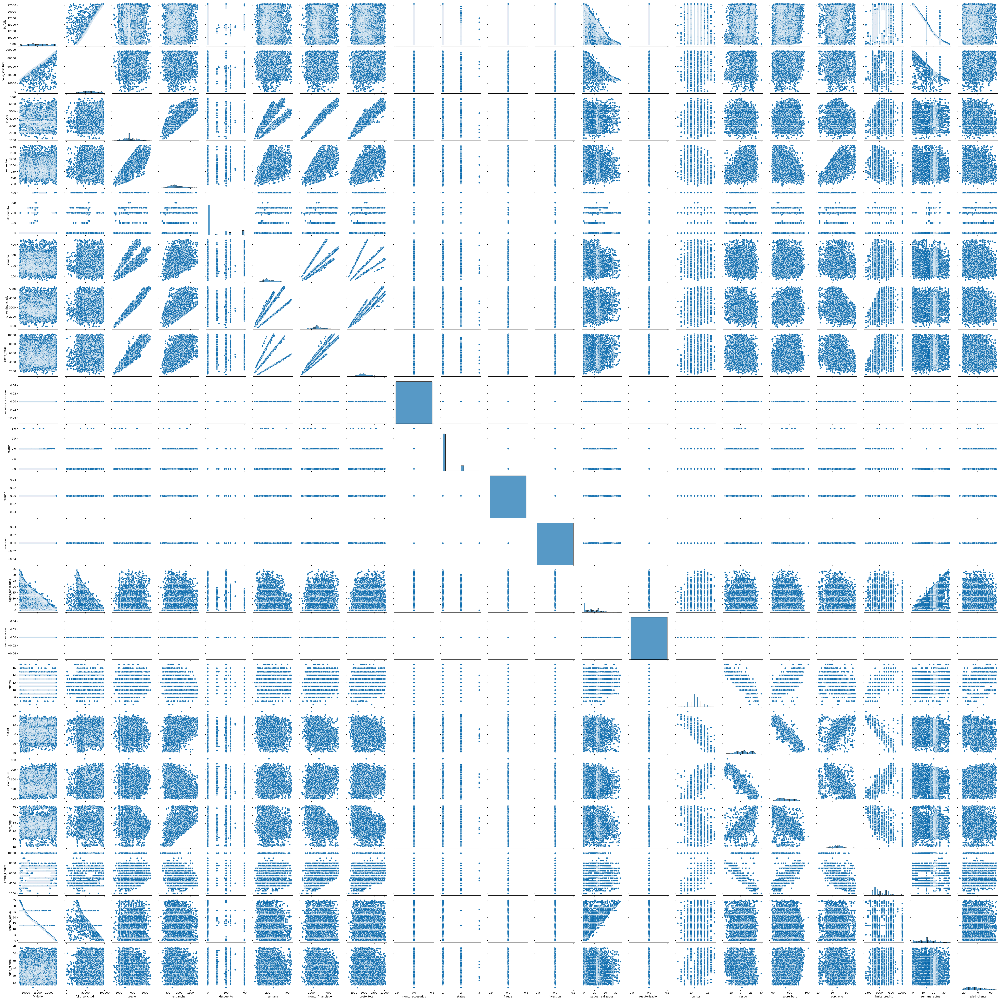

In [ ]:
sns.pairplot(df1)

### Variable Independiente : Riesgo

#### Modelo 1 score_buro (Función cociente entre polinomios)

In [ ]:
df3 = df2[df2['riesgo'] != 0]
df3 = df2[df2['score_buro'] != 0]

In [ ]:
Vars_Indep= df3[['riesgo']]
Var_Dep= df3['score_buro']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a, b, c):
     return  (a*x**2 + b*x + c)

In [ ]:
parametros, covs= curve_fit(func1, df3['riesgo'], df3['score_buro'])

In [ ]:
print(parametros)

[ 5.92687651e-03 -4.49839362e+00  5.85302991e+02]


In [ ]:
parametros, _ = curve_fit(func1, df3['riesgo'], df3['score_buro'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 = (a*x**2 + b*x + c)

In [ ]:
yfit1

,riesgo
7243,459.834079
7247,589.807312
7250,418.880419
7254,493.450478
7255,536.537813
...,...
22721,565.402507
22722,466.288003
22727,569.631218
22731,501.973115


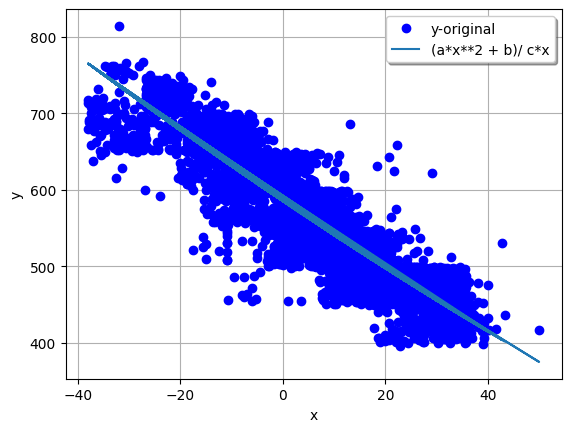

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="(a*x**2 + b)/ c*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

0.8381720366254574

In [ ]:
corr= np.sqrt(abs(R2))
corr

0.9155173600896148

In [ ]:
df_cor.loc[0] = ['Riesgo', 'Modelo 1', round(R2,2), round(corr,2)]

#### Modelo 2 puntos ("Función exponencial")

In [ ]:
df3 = df2[df2['riesgo'] >= -50]
df3 = df3[df3['puntos'] > 0]

In [ ]:
Vars_Indep= df3[['riesgo']]
Var_Dep= df3['puntos']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a, b, c):
     return  (a*x**2 + b)/ c * x

In [ ]:
parametros, covs= curve_fit(func1, df3['riesgo'], df3['puntos'])

In [ ]:
parametros

array([8.57225750e-03, 2.25043114e+01, 1.72597362e+02])

In [ ]:
parametros, _ = curve_fit(func1, df3['riesgo'], df3['puntos'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 =  (a*x**2 + b)/ c*x

In [ ]:
yfit1

,riesgo
7243,4.992509
7247,-0.130436
7250,8.031211
7254,3.198069
7255,1.500354
...,...
22721,0.584595
22722,4.606379
22727,0.458481
22731,2.817998


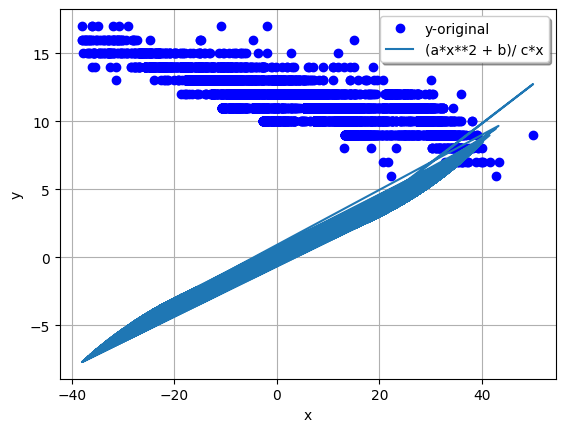

In [ ]:
plt.plot(x, y, 'bo', label= "y-original")
plt.plot(x, yfit1, label= "(a*x**2 + b)/ c*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

-47.04212616131817

In [ ]:
corr= np.sqrt(abs(R2))
corr

6.858726278349223

In [ ]:
df_cor.loc[1] = ['Riesgo', 'Modelo 1', round(R2,2), round(corr,2)]

#### Modelo 3 ("Función inversa")

In [ ]:
df3 = df2[df2['riesgo'] >= 0]
df3 = df3[df3['pagos_realizados'] != 0]

In [ ]:
Vars_Indep= df3[['riesgo']]
Var_Dep= df3['pagos_realizados']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a):
     return 1/a*x

In [ ]:
parametros, covs= curve_fit(func1, df3['riesgo'], df3['pagos_realizados'])

In [ ]:
parametros

array([2.47141081])

In [ ]:
parametros, _ = curve_fit(func1, df3['riesgo'], df3['pagos_realizados'])
a = parametros[ 0 ]
yfit1 = 1/a*x

In [ ]:
yfit1

,riesgo
7243,11.734188
7250,15.780460
7254,8.497171
7255,4.450899
7256,4.855526
...,...
22178,10.682158
22275,13.696630
22389,2.974010
22506,4.491362


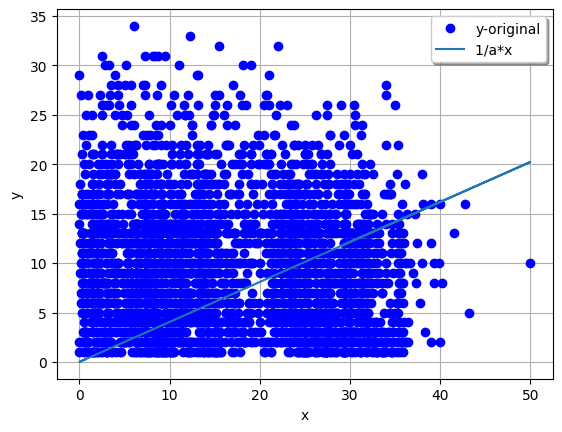

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="1/a*x ")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

-0.8319674186958794

In [ ]:
corr= np.sqrt(abs(R2))
corr

0.9121224800956719

In [ ]:
df_cor.loc[2] = ['Riesgo', 'Modelo 3', round(R2,2), round(corr,2)]

#### Modelo 4 ("Función senoidal")

In [ ]:
df3 = df2[df2['riesgo']!=0]
df3 = df3[df3['costo_total'] > 0]

In [ ]:
Vars_Indep= df3[['riesgo']]
Var_Dep= df3['costo_total']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a, b):
     return a*np.sin(x) + b

In [ ]:
parametros, covs= curve_fit(func1, df3['riesgo'], df3['costo_total'])

In [ ]:
parametros

array([  45.538913  , 5337.08830037])

In [ ]:
parametros, _ = curve_fit(func1, df3['riesgo'], df3['costo_total'])
a, b= parametros[ 0 ], parametros[ 1 ]
yfit1 = a*np.sin(x) + b

In [ ]:
yfit1

,riesgo
7243,5306.867135
7247,5298.768626
7250,5380.978495
7254,5375.188689
7255,5291.549833
...,...
22721,5293.108045
22722,5370.518217
22727,5321.114013
22731,5343.913546


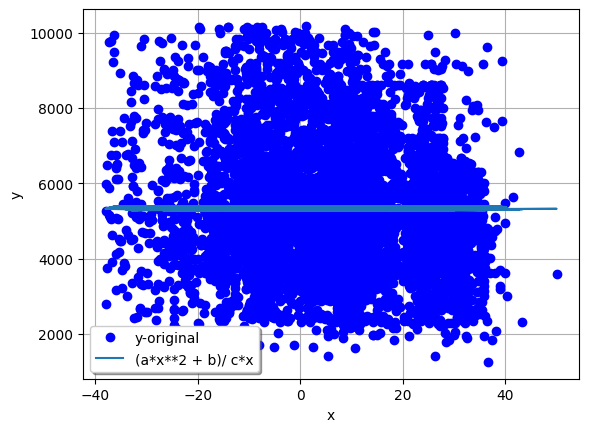

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="(a*x**2 + b)/ c*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

0.0003522534581614778

In [ ]:
corr= np.sqrt(abs(R2))
corr

0.01876841650650043

In [ ]:
df_cor.loc[3] = ['Riesgo', 'Modelo 4', round(R2,2), round(corr,2)]

#### Modelo 5 ("Función tangencial")

In [ ]:
df3 = df2[df2['riesgo'] > -40]
df3 = df3[df3['porc_eng'] >= 15]

In [ ]:
Vars_Indep= df3[['riesgo']]
Var_Dep= df3['porc_eng']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a, b):
     return a*np.tan(x) + b

In [ ]:
parametros, covs= curve_fit(func1, df3['riesgo'], df3['porc_eng'])

In [ ]:
parametros

array([7.53487596e-03, 2.36594504e+01])

In [ ]:
parametros, _ = curve_fit(func1, df3['riesgo'], df3['porc_eng'])
a, b= parametros[ 0 ], parametros[ 1 ]
yfit1 = a*np.tan(x) + b

In [ ]:
yfit1

,riesgo
7243,23.666135
7247,23.647716
7250,23.686686
7254,23.647941
7255,21.956939
...,...
22720,23.664246
22721,23.687505
22727,23.662273
22731,23.660593


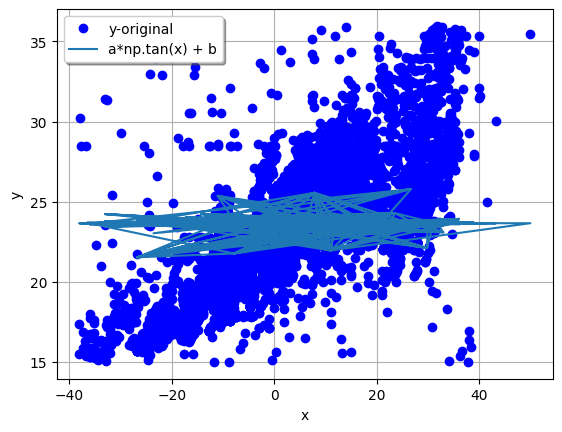

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.tan(x) + b")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

0.0017713901619792471

In [ ]:
corr= np.sqrt(abs(R2))
corr

0.042087886166678024

In [ ]:
df_cor.loc[4] = ['Riesgo', 'Modelo 5', round(R2,2), round(corr,2)]

### Variable Independiente : score_buro

#### Modelo 6 (Función Valor absoluto)

In [ ]:
df3 = df2[df2['score_buro'] != 0]
df3 = df3[df3['porc_eng'] != 0]

In [ ]:
Vars_Indep= df3[['score_buro']]
Var_Dep= df3['porc_eng']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a, b, c):
     return a*np.abs(x) + b*x + c

In [ ]:
parametros, covs= curve_fit(func1, df3['score_buro'], df3['porc_eng'])

In [ ]:
parametros

array([-100.01666794,   99.98348946,   41.89718591])

In [ ]:
parametros, _ = curve_fit(func1, df3['score_buro'], df3['porc_eng'])
a, b, c= parametros[ 0 ], parametros[ 1 ],parametros[ 2 ]
yfit1 = a*np.abs(x) + b*x + c

In [ ]:
yfit1

,score_buro
7243,21.260172
7247,20.629780
7250,28.658973
7254,24.710733
7255,22.089634
...,...
22721,22.985453
22722,26.004694
22727,20.563423
22731,25.241589


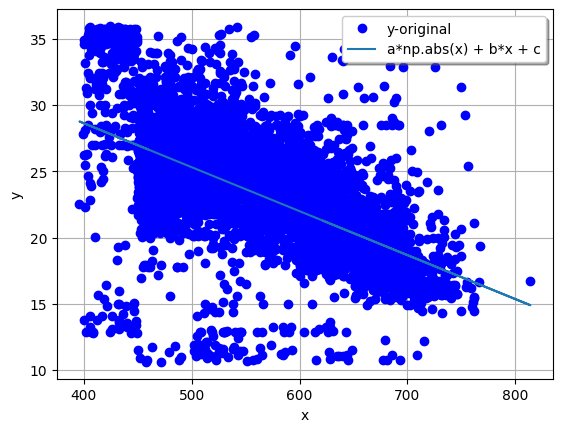

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.abs(x) + b*x + c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

0.35827836367580734

In [ ]:
corr= np.sqrt(abs(R2))
corr

0.5985635836532384

In [ ]:
df_cor.loc[5] = ['Riesgo', 'Modelo 6', round(R2,2), round(corr,2)]

#### Modelo 7 (Función cociente entre polinomios)

In [ ]:
df3 = df2[df2['score_buro'] != 0]
df3 = df3[df3['puntos'] != 0]

In [ ]:
Vars_Indep= df3[['score_buro']]
Var_Dep= df3['puntos']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a, b, c):
     return (a*x**2 + b)/ c*x

In [ ]:
parametros, covs= curve_fit(func1, df3['score_buro'], df3['puntos'])

In [ ]:
parametros

array([-1.15143859e-07,  2.79197717e-01,  1.17437415e+01])

In [ ]:
parametros, _ = curve_fit(func1, df3['score_buro'], df3['puntos'])
a, b, c= parametros[ 0 ], parametros[ 1 ],parametros[ 2 ]
yfit1 = (a*x**2 + b)/ c*x

In [ ]:
yfit1

,score_buro
7243,12.428113
7247,12.656933
7250,8.863088
7254,10.952247
7255,12.106974
...,...
22721,11.735516
22722,10.310269
22727,12.680235
22731,10.694280


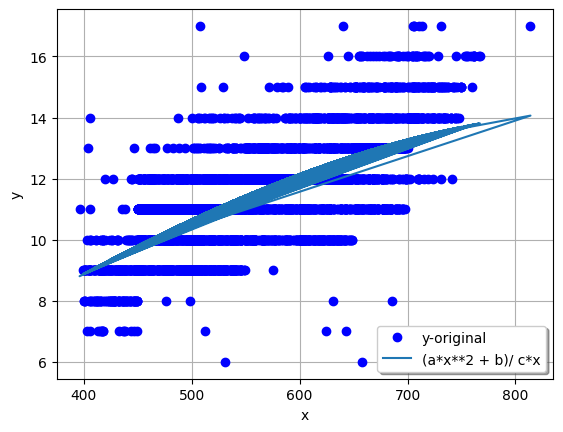

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="(a*x**2 + b)/ c*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

0.4577544349669559

In [ ]:
corr= np.sqrt(abs(R2))
corr

0.6765755205200347

In [ ]:
df_cor.loc[6] = ['Riesgo', 'Modelo 7', round(R2,2), round(corr,2)]

#### Modelo 8 (Función logaritmica)

In [ ]:
df3 = df2[df2['score_buro'] != 0]
#df3 = df3[df3['monto_accesorios'] != 0]

In [ ]:
Vars_Indep= df3[['score_buro']]
Var_Dep= df3['monto_accesorios']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a, b):
     return a*np.log(x) + b

In [ ]:
parametros, covs= curve_fit(func1, df3['score_buro'], df3['monto_accesorios'])

In [ ]:
parametros

array([ 2.47e-323, -1.43e-322])

In [ ]:
parametros, _ = curve_fit(func1, df3['score_buro'], df3['monto_accesorios'])
a, b = parametros[ 0 ], parametros[ 1 ]
yfit1 = a*np.log(x) + b

In [ ]:
yfit1

,score_buro
7243,1.482197e-323
7247,1.482197e-323
7250,4.940656e-324
7254,9.881313e-324
7255,1.482197e-323
...,...
22721,1.482197e-323
22722,9.881313e-324
22727,1.482197e-323
22731,9.881313e-324


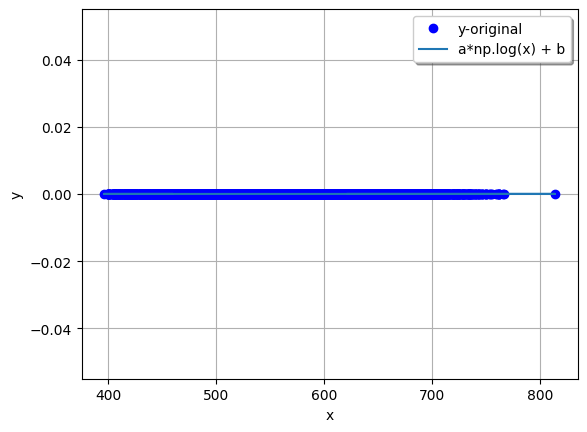

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.log(x) + b")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

1.0

In [ ]:
corr= np.sqrt(abs(R2))
corr

1.0

In [ ]:
df_cor.loc[7] = ['Riesgo', 'Modelo 1', round(R2,2), round(corr,2)]

#### Modelo 9 (Función lineal con producto de coeficientes)

In [ ]:
df3 = df2[df2['score_buro'] != 0]
df3 = df3[df3['semana'] != 0]

In [ ]:
Vars_Indep= df3[['score_buro']]
Var_Dep= df3['semana']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a, b, c):
     return  a*x + b*x + c*x

In [ ]:
parametros, covs= curve_fit(func1, df3['score_buro'], df3['semana'])

In [ ]:
parametros

array([141.55043398, -70.58160037, -70.58160037])

In [ ]:
parametros, _ = curve_fit(func1, df3['score_buro'], df3['semana'])
a, b, c= parametros[ 0 ], parametros[ 1 ],parametros[ 2 ]
yfit1 =  a*x + b*x + c*x

In [ ]:
yfit1

,score_buro
7243,240.859074
7247,248.216506
7250,154.506062
7254,200.586817
7255,231.178243
...,...
22721,220.722946
22722,185.484721
22727,248.990972
22731,194.391085


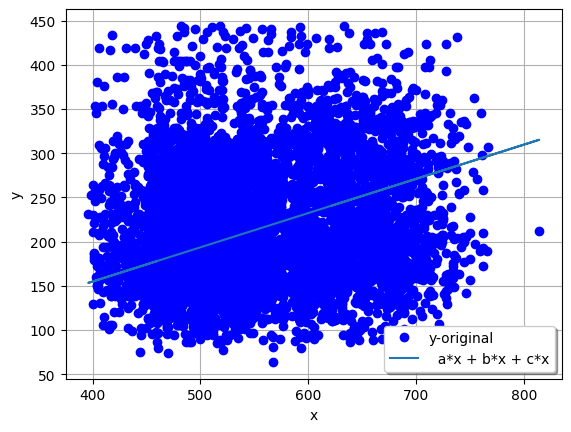

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="  a*x + b*x + c*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

-0.11892073446444518

In [ ]:
corr= np.sqrt(abs(R2))
corr

0.3448488574208202

In [ ]:
df_cor.loc[8] = ['score_buro', 'Modelo 9', round(R2,2), round(corr,2)]

#### Modelo 10 (Función cuadrática inversa)

In [ ]:
df3 = df2[df2['score_buro'] != 0]
df3 = df3[df3['semana'] != 0]

In [ ]:
Vars_Indep= df3[['score_buro']]
Var_Dep= df3['semana']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a):
     return  1/a*x**2

In [ ]:
parametros, covs= curve_fit(func1, df3['score_buro'], df3['semana'])

In [ ]:
parametros

array([1555.51677521])

In [ ]:
parametros, _ = curve_fit(func1, df3['score_buro'], df3['semana'])
a = parametros[ 0 ]
yfit1 =  1/a*x**2

In [ ]:
yfit1

,score_buro
7243,248.717343
7247,264.144371
7250,102.346052
7254,172.498300
7255,229.125784
...,...
22721,208.869493
22722,147.501463
22727,265.795269
22731,162.006610


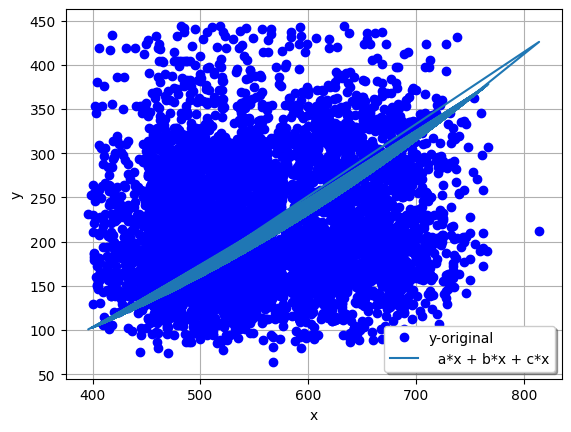

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="  a*x + b*x + c*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

-0.6224769060962285

In [ ]:
corr= np.sqrt(abs(R2))
corr

0.7889720566003771

In [ ]:
df_cor.loc[9] = ['score_buro', 'Modelo 10', round(R2,2), round(corr,2)]

### Variable Independiente : porc_eng

#### Modelo 11 (Función polinomial inversa)

In [ ]:
df3 = df2[df2['porc_eng'] != 0]
df3 = df3[df3['semana_actual'] != 0]

In [ ]:
Vars_Indep= df3[['porc_eng']]
Var_Dep= df3['semana_actual']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a, b, c):
     return  a/b*x**2 + c*x

In [ ]:
parametros, covs= curve_fit(func1, df3['porc_eng'], df3['semana_actual'])

In [ ]:
parametros

array([-0.15694168,  5.4893799 ,  1.28053402])

In [ ]:
parametros, _ = curve_fit(func1, df3['porc_eng'], df3['semana_actual'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 =  a/b*x**2 + c*x

In [ ]:
yfit1

,porc_eng
7243,14.082119
7247,13.546170
7250,13.487781
7254,14.044985
7255,13.608128
...,...
22401,11.755786
22402,14.013007
22403,14.324011
22407,13.661869


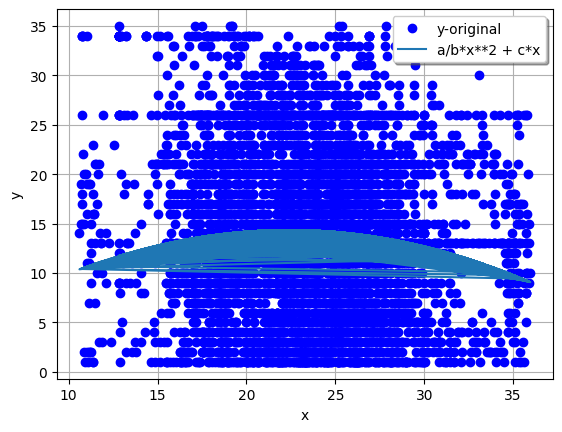

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a/b*x**2 + c*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

-0.01251279523656934

In [ ]:
corr= np.sqrt(abs(R2))
corr

0.11186060627660366

In [ ]:
df_cor.loc[10] = ['porc_eng', 'Modelo 11', round(R2,2), round(corr,2)]

#### Modelo 12 ("Función cuadrática")

In [ ]:
df3 = df2[df2['porc_eng'] != 0]
df3 = df3[df3['puntos'] != 0]

In [ ]:
Vars_Indep= df3[['porc_eng']]
Var_Dep= df3['puntos']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a, b, c):
     return  a*x**2 + b*x + c

In [ ]:
parametros, covs= curve_fit(func1, df3['porc_eng'], df3['puntos'])

In [ ]:
parametros

array([-8.57458396e-04, -1.56049055e-01,  1.55919134e+01])

In [ ]:
parametros, _ = curve_fit(func1, df3['porc_eng'], df3['puntos'])
a, b, c = parametros[ 0 ], parametros[ 1 ], parametros[ 2 ]
yfit1 =  a*x**2 + b*x + c

In [ ]:
yfit1

,porc_eng
7243,11.077066
7247,12.667183
7250,10.580883
7254,12.281568
7255,12.628206
...,...
22721,11.011107
22722,13.703275
22727,11.154776
22731,10.244329


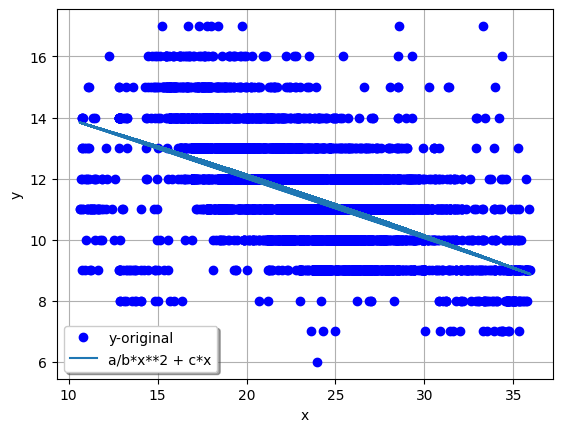

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a/b*x**2 + c*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

0.3009605401139107

In [ ]:
corr= np.sqrt(abs(R2))
corr

0.5485987058988662

In [ ]:
df_cor.loc[11] = ['porc_eng', 'Modelo 12', round(R2,2), round(corr,2)]

#### Modelo 13 ("Función inversa")

In [ ]:
df3 = df2[df2['porc_eng'] != 0]
df3 = df3[df3['enganche'] != 0]

In [ ]:
Vars_Indep= df3[['porc_eng']]
Var_Dep= df3['enganche']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a):
     return  1/a*x

In [ ]:
parametros, covs= curve_fit(func1, df3['porc_eng'], df3['enganche'])

In [ ]:
parametros

array([0.02648919])

In [ ]:
parametros, _ = curve_fit(func1, df3['porc_eng'], df3['enganche'])
a = parametros[ 0 ]
yfit1 =  1/a*x

In [ ]:
yfit1

,porc_eng
7243,958.504131
7247,646.678841
7250,1051.372196
7254,724.446407
7255,654.606602
...,...
22721,970.962042
22722,429.986690
22727,943.781145
22731,1113.284239


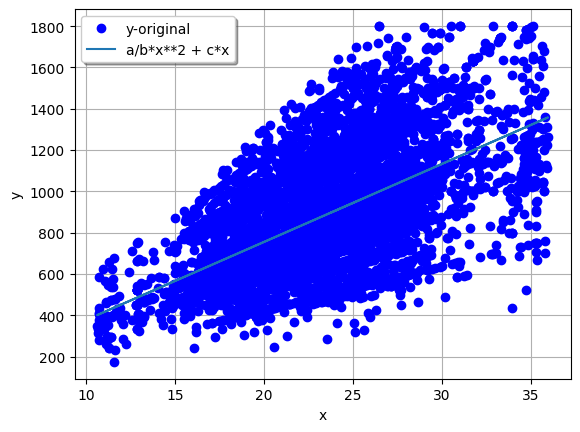

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a/b*x**2 + c*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

0.34078523242179104

In [ ]:
corr= np.sqrt(abs(R2))
corr

0.5837681324137102

In [ ]:
df_cor.loc[12] = ['porc_eng', 'Modelo 13', round(R2,2), round(corr,2)]

#### Modelo 14 ("Función senoidal")

In [ ]:
df3 = df2[df2['porc_eng'] != 0]
df3 = df3[df3['costo_total'] >= 0]

In [ ]:
Vars_Indep= df3[['porc_eng']]
Var_Dep= df3['costo_total']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a, b):
     return  a*np.sin(x) + b

In [ ]:
parametros, covs= curve_fit(func1, df3['porc_eng'], df3['costo_total'])

In [ ]:
parametros

array([ -69.90590185, 5334.86885781])

In [ ]:
parametros, _ = curve_fit(func1, df3['porc_eng'], df3['costo_total'])
a, b = parametros[ 0 ], parametros[ 1 ]
yfit1 =  a*np.sin(x) + b

In [ ]:
yfit1

,porc_eng
7243,5317.082665
7247,5404.002697
7250,5306.087631
7254,5311.526878
7255,5404.643714
...,...
22721,5296.135316
22722,5399.407203
22727,5344.121026
22731,5400.412717


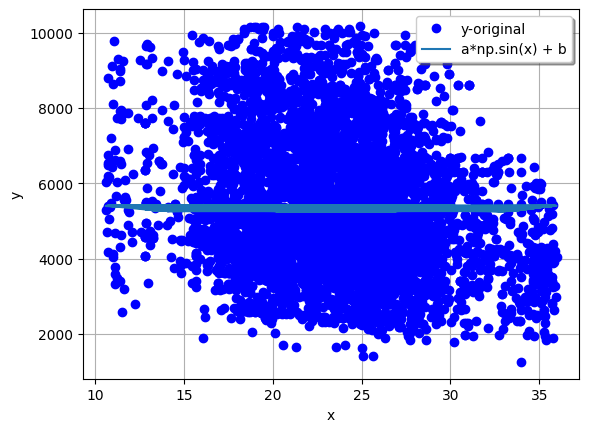

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.sin(x) + b")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

0.0007578639085203953

In [ ]:
corr= np.sqrt(abs(R2))
corr

0.02752932815236135

In [ ]:
df_cor.loc[13] = ['porc_eng', 'Modelo 14', round(R2,2), round(corr,2)]

#### Modelo 15 ("Función tangencial")

In [ ]:
df3 = df2[df2['porc_eng'] != 0]
df3 = df3[df3['precio'] != 0]

In [ ]:
Vars_Indep= df3[['porc_eng']]
Var_Dep= df3['precio']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a, b):
     return  a*np.tan(x) + b

In [ ]:
parametros, covs= curve_fit(func1, df3['porc_eng'], df3['precio'])

In [ ]:
parametros

array([-2.88445565e-01,  3.77413952e+03])

In [ ]:
parametros, _ = curve_fit(func1, df3['porc_eng'], df3['precio'])
a, b = parametros[ 0 ], parametros[ 1 ]
yfit1 =  a*np.tan(x) + b

In [ ]:
yfit1

,porc_eng
7243,3774.063634
7247,3772.214840
7250,3774.269835
7254,3774.037343
7255,3778.843684
...,...
22721,3773.947534
22722,3774.832503
22727,3774.178036
22731,3773.361732


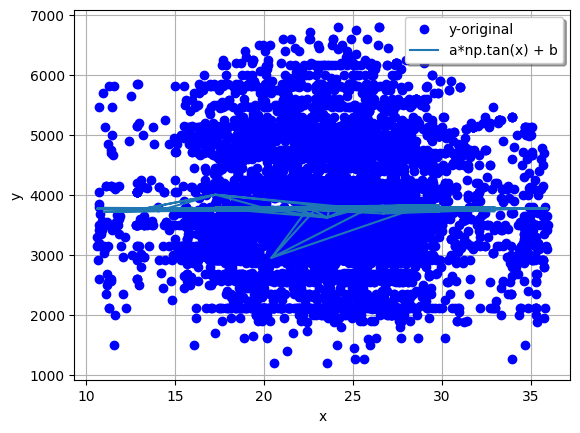

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.tan(x) + b")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

0.000277710737501935

In [ ]:
corr= np.sqrt(abs(R2))
corr

0.016664655337027975

In [ ]:
df_cor.loc[14] = ['porc_eng', 'Modelo 15', round(R2,2), round(corr,2)]

### Variable Independiente : limite_credito

#### Modelo 16 (Función Valor absoluto)

In [ ]:
df3 = df1[df1['limite_credito'] != 0]
df3 = df3[df3['porc_eng'] != 0]

In [ ]:
Vars_Indep= df3[['limite_credito']]
Var_Dep= df3['porc_eng']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a, b, c):
     return a*np.abs(x) + b*x + c

In [ ]:
parametros, covs= curve_fit(func1, df3['limite_credito'], df3['porc_eng'])

In [ ]:
parametros

array([ 100.00488229, -100.00722971,   35.70836256])

In [ ]:
parametros, _ = curve_fit(func1, df3['limite_credito'], df3['porc_eng'])
a, b, c= parametros[ 0 ], parametros[ 1 ],parametros[ 2 ]
yfit1 = a*np.abs(x) + b*x + c

In [ ]:
yfit1

,limite_credito
7243,28.666107
7247,21.623851
7250,29.252962
7254,26.318688
7255,23.971270
...,...
22721,22.797561
22722,12.234177
22727,21.623851
22731,23.971270


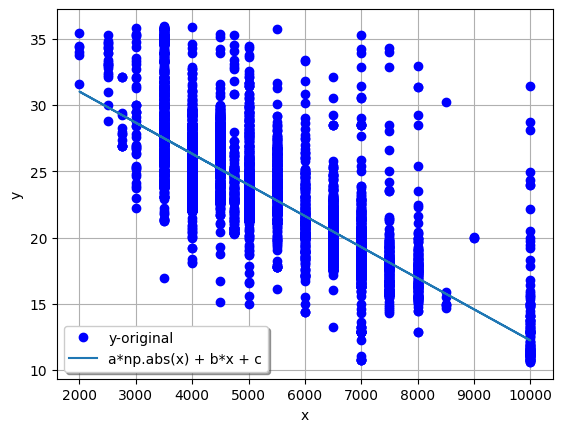

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.abs(x) + b*x + c")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

0.5998489596750914

In [ ]:
corr= np.sqrt(abs(R2))
corr

0.7744991669944464

In [ ]:
df_cor.loc[15] = ['limite_credito', 'Modelo 16', round(R2,2), round(corr,2)]

#### Modelo 17 (Función cociente entre polinomios)

In [ ]:
#df3 = df2[df2['limite_credito'] != 0]
df3 = df2[df2['puntos'] != 0]

In [ ]:
Vars_Indep= df3[['limite_credito']]
Var_Dep= df3['puntos']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a, b, c):
     return (a*x**2 + b)/ c*x

In [ ]:
parametros, covs= curve_fit(func1, df3['limite_credito'], df3['puntos'])

In [ ]:
parametros

array([-7.07530472e-07,  1.10310457e+02,  3.95073872e+04])

In [ ]:
parametros, _ = curve_fit(func1, df3['limite_credito'], df3['puntos'])
a, b, c= parametros[ 0 ], parametros[ 1 ],parametros[ 2 ]
yfit1 = (a*x**2 + b)/ c*x

In [ ]:
yfit1

,limite_credito
7243,7.892905
7247,12.884582
7250,7.305959
7254,10.022426
7255,11.722136
...,...
22721,12.377233
22722,10.012661
22727,12.884582
22731,11.722136


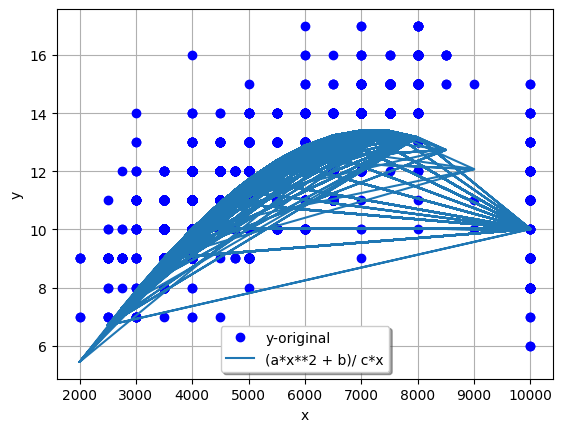

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="(a*x**2 + b)/ c*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

0.4538819998752316

In [ ]:
corr= np.sqrt(abs(R2))
corr

0.6737076516377349

In [ ]:
df_cor.loc[16] = ['limite_credito', 'Modelo 17', round(R2,2), round(corr,2)]

#### Modelo 18 (Función logaritmica)

In [ ]:
df3 = df2[df2['limite_credito'] != 0]
df3 = df3[df3['monto_accesorios'] > -100]

In [ ]:
Vars_Indep= df3[['limite_credito']]
Var_Dep= df3['monto_accesorios']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a, b):
     return a*np.log(x) + b

In [ ]:
parametros, covs= curve_fit(func1, df3['limite_credito'], df3['monto_accesorios'])

In [ ]:
parametros

array([-3.5e-323,  2.7e-322])

In [ ]:
parametros, _ = curve_fit(func1, df3['limite_credito'], df3['monto_accesorios'])
a, b = parametros[ 0 ], parametros[ 1 ]
yfit1 = a*np.log(x) + b

In [ ]:
yfit1

,limite_credito
7243,-4.940656e-324
7247,-2.964394e-323
7250,0.000000e+00
7254,-1.482197e-323
7255,-2.470328e-323
...,...
22721,-2.470328e-323
22722,-4.446591e-323
22727,-2.964394e-323
22731,-2.470328e-323


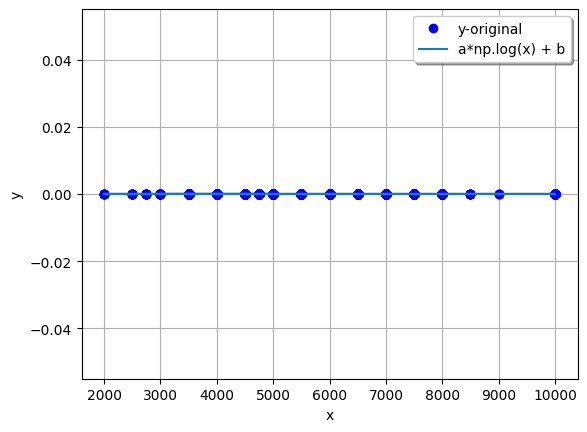

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="a*np.log(x) + b")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

1.0

In [ ]:
corr= np.sqrt(abs(R2))
corr

1.0

In [ ]:
df_cor.loc[17] = ['limite_credito', 'Modelo 18', round(R2,2), round(corr,2)]

#### Modelo 19 (Función lineal con producto de coeficientes)

In [ ]:
df3 = df2[df2['limite_credito'] != 0]
df3 = df3[df3['semana'] != 0]

In [ ]:
Vars_Indep= df3[['limite_credito']]
Var_Dep= df3['semana']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a, b, c):
     return  a*x + b*x + c*x

In [ ]:
parametros, covs= curve_fit(func1, df3['limite_credito'], df3['semana'])

In [ ]:
parametros

array([141.4344122 , -70.69763369, -70.69763369])

In [ ]:
parametros, _ = curve_fit(func1, df3['limite_credito'], df3['semana'])
a, b, c= parametros[ 0 ], parametros[ 1 ],parametros[ 2 ]
yfit1 =  a*x + b*x + c*x

In [ ]:
yfit1

,limite_credito
7243,117.434456
7247,234.868913
7250,107.648252
7254,156.579275
7255,195.724094
...,...
22721,215.296503
22722,391.448188
22727,234.868913
22731,195.724094


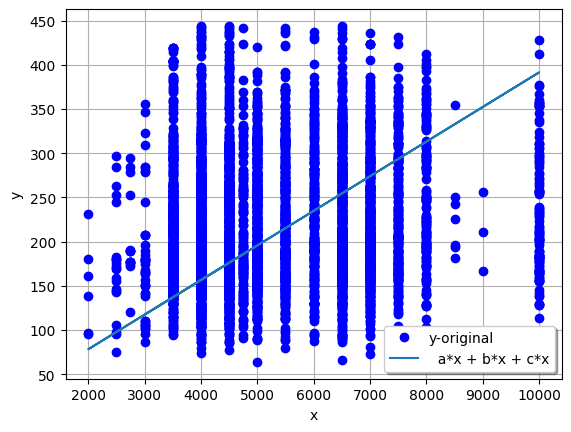

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="  a*x + b*x + c*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

-0.5586727230408397

In [ ]:
corr= np.sqrt(abs(R2))
corr

0.7474441270361549

In [ ]:
df_cor.loc[18] = ['limite_credito', 'Modelo 19', round(R2,2), round(corr,2)]

#### Modelo 20 (Función cuadrática inversa)

In [ ]:
df3 = df2[df2['limite_credito'] != 0]
df3 = df3[df3['semana'] != 0]

In [ ]:
Vars_Indep= df3[['limite_credito']]
Var_Dep= df3['semana']

In [ ]:
x= Vars_Indep
y= Var_Dep

In [ ]:
def  func1 (x, a):
     return  1/a*x**2

In [ ]:
parametros, covs= curve_fit(func1, df3['limite_credito'], df3['semana'])

In [ ]:
parametros

array([179052.82451032])

In [ ]:
parametros, _ = curve_fit(func1, df3['limite_credito'], df3['semana'])
a = parametros[ 0 ]
yfit1 =  1/a*x**2

In [ ]:
yfit1

,limite_credito
7243,50.264496
7247,201.057984
7250,42.236139
7254,89.359104
7255,139.623600
...,...
22721,168.944556
22722,558.494401
22727,201.057984
22731,139.623600


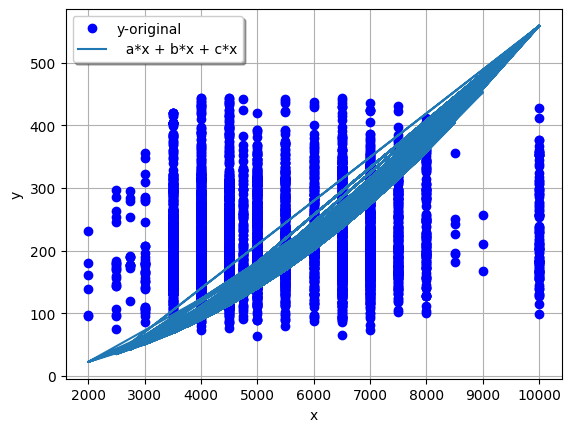

In [ ]:
plt.plot(x, y, 'bo', label="y-original")
plt.plot(x, yfit1, label="  a*x + b*x + c*x")
plt.xlabel('x')
plt.ylabel('y')
plt.legend(loc='best', fancybox=True, shadow=True)
plt.grid(True)
plt.show()

In [ ]:
R2 = r2_score(y, yfit1)
R2

-2.3258736604487207

In [ ]:
corr= np.sqrt(abs(R2))
corr

1.525081525836806

In [ ]:
df_cor.loc[19] = ['limite_credito', 'Modelo 20', round(R2,2), round(corr,2)]

## tabla de coeficientes de determinacion :

In [ ]:
df_cor

,Variable,Modelo,Determinación,Correlación
0,Riesgo,Modelo 1,0.84,0.92
1,Riesgo,Modelo 1,-47.04,6.86
2,Riesgo,Modelo 3,-0.83,0.91
3,Riesgo,Modelo 4,0.00,0.02
4,Riesgo,Modelo 5,0.00,0.04
5,Riesgo,Modelo 6,0.36,0.60
6,Riesgo,Modelo 7,0.46,0.68
7,Riesgo,Modelo 1,1.00,1.00
8,score_buro,Modelo 9,-0.12,0.34
9,score_buro,Modelo 10,-0.62,0.79
